<a href="https://colab.research.google.com/github/jryuuu22/Projects/blob/master/getting_started.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# # Core conda-style deps, installed via pip with matching versions
!pip install \
   torch==2.3.1 \
   pytorch-lightning==2.2.2 \
   numpy==1.26.4 \
   scipy==1.13.1 \
   h5py==3.11.0 \
   unidecode==1.3.8 \
   pandas==2.2.2 \
   pyyaml==6.0.1 \
   pytest==8.2.2 \
   click==8.1.7 \
   pre-commit==3.7.1 \
   black==24.4.2 \
   flake8==7.0.0 \
   mypy==1.10.0 \
   trio==0.25.1 \
   hydra-core==1.3.2 \
   ffmpeg-python \
   plotly==5.24.1 \
   av==13.1.0 \
   opencv-python==4.10.0.84 \
   pillow==11.0.0 \
   kaleido==0.2.1 \
   matplotlib==3.9.2 \
   mediapy==1.2.2 \
   joblib==1.4.2 \
   nbformat==5.10.4


In [ ]:
!git clone https://github.com/uddhavp22/emg2pose-TNT.git  # or actual repo URL
%cd emg2pose-TNT
!pip install -e.

fatal: destination path 'emg2pose-TNT' already exists and is not an empty directory.
/content/emg2pose-TNT
Obtaining file:///content/emg2pose-TNT
  Preparing metadata (setup.py) ... done
  Attempting uninstall: emg2pose
    Found existing installation: emg2pose 0.1.0
    Uninstalling emg2pose-0.1.0:
      Successfully uninstalled emg2pose-0.1.0
  Running setup.py develop for emg2pose


In [ ]:
%cd /content/emg2pose-TNT/emg2pose/UmeTrack
!pip uninstall -y lib || true
!pip install -e .

/content/emg2pose-TNT/emg2pose/UmeTrack
Obtaining file:///content/emg2pose-TNT/emg2pose/UmeTrack
  Preparing metadata (setup.py) ... done
  Attempting uninstall: UmeTrack
    Found existing installation: UmeTrack 0.1.0
    Uninstalling UmeTrack-0.1.0:
      Successfully uninstalled UmeTrack-0.1.0
  Running setup.py develop for UmeTrack


# Getting Started

This notebook showcases basic functionality of the code base.

Here, we load the metadata, an example dataset, and run inference using a pre-trained model.

We also show how to visualize the joint angle predictions using a hand mesh (requires the UmeTrack package -- see README.md).

In [ ]:
# %load_ext autoreload
# %autoreload 2

In [ ]:
import sys
sys.path.append("/content/drive/MyDrive/emg/emg2pose")


from emg2pose.data import Emg2PoseSessionData
print("✅ Import successful!")

✅ Import successful!


In [ ]:
from pathlib import Path
DATA_DOWNLOAD_DIR = Path("/content/drive/MyDrive/emg")

In [ ]:
print(DATA_DOWNLOAD_DIR)

/content/drive/MyDrive/emg


## Download Dataset Metadata

In [ ]:
!cd {DATA_DOWNLOAD_DIR} && curl https://fb-ctrl-oss.s3.amazonaws.com/emg2pose/emg2pose_metadata.csv -o emg2pose_metadata.csv

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 5541k  100 5541k    0     0  13.6M      0 --:--:-- --:--:-- --:--:-- 13.5M


In [ ]:
import pandas as pd

metadata_df = pd.read_csv(DATA_DOWNLOAD_DIR / "emg2pose_metadata.csv")
metadata_df.head(5)

,session,user,stage,start,end,side,filename,moving_hand,held_out_user,held_out_stage,split,generalization
0,2022-04-07-1649318400-8125c-cv-emg-pose-train@2,29ddab35d7,ThumbsUpDownThumbRotationsCWCCWP,1.649400e+09,1.649400e+09,left,2022-04-07-1649318400-8125c-cv-emg-pose-train@...,both,True,False,val,user
1,2022-04-07-1649318400-8125c-cv-emg-pose-train@2,29ddab35d7,ThumbsUpDownThumbRotationsCWCCWP,1.649400e+09,1.649400e+09,right,2022-04-07-1649318400-8125c-cv-emg-pose-train@...,both,True,False,val,user
2,2022-04-07-1649318400-8125c-cv-emg-pose-train@2,29ddab35d7,HandClawGraspFlicks,1.649401e+09,1.649401e+09,left,2022-04-07-1649318400-8125c-cv-emg-pose-train@...,both,True,False,val,user
3,2022-04-07-1649318400-8125c-cv-emg-pose-train@2,29ddab35d7,HandClawGraspFlicks,1.649401e+09,1.649401e+09,right,2022-04-07-1649318400-8125c-cv-emg-pose-train@...,both,True,False,val,user
4,2022-04-07-1649318400-8125c-cv-emg-pose-train@2,29ddab35d7,ShakaVulcanPeace,1.649401e+09,1.649401e+09,left,2022-04-07-1649318400-8125c-cv-emg-pose-train@...,both,True,True,val,user_stage


## Download a Smaller (~600 MiB) Version of the Dataset

In [ ]:
!cd {DATA_DOWNLOAD_DIR} && curl "https://fb-ctrl-oss.s3.amazonaws.com/emg2pose/emg2pose_dataset_mini.tar" -o emg2pose_dataset_mini.tar


  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  617M  100  617M    0     0  39.9M      0  0:00:15  0:00:15 --:--:-- 36.7M


In [ ]:
# Unpack the tar to ~/emg2pose_dataset_mini
!tar -xvf {DATA_DOWNLOAD_DIR}/emg2pose_dataset_mini.tar -C {DATA_DOWNLOAD_DIR}

emg2pose_dataset_mini/
emg2pose_dataset_mini/2022-12-06-1670313600-e3096-cv-emg-pose-train@2-recording-13_right.hdf5
emg2pose_dataset_mini/2022-12-06-1670313600-e3096-cv-emg-pose-train@2-recording-3_left.hdf5
emg2pose_dataset_mini/2022-12-06-1670313600-e3096-cv-emg-pose-train@2-recording-1_right.hdf5
emg2pose_dataset_mini/2022-12-06-1670313600-e3096-cv-emg-pose-train@2-recording-15_left.hdf5
emg2pose_dataset_mini/2022-12-06-1670313600-e3096-cv-emg-pose-train@2-recording-5_left.hdf5
emg2pose_dataset_mini/2022-12-06-1670313600-e3096-cv-emg-pose-train@2-recording-4_right.hdf5
emg2pose_dataset_mini/2022-12-06-1670313600-e3096-cv-emg-pose-train@2-recording-13_left.hdf5
emg2pose_dataset_mini/2022-12-06-1670313600-e3096-cv-emg-pose-train@2-recording-8_left.hdf5
emg2pose_dataset_mini/2022-12-06-1670313600-e3096-cv-emg-pose-train@2-recording-9_right.hdf5
emg2pose_dataset_mini/2022-12-06-1670313600-e3096-cv-emg-pose-train@2-recording-2_left.hdf5
emg2pose_dataset_mini/2022-12-06-1670313600-e3096-

In [ ]:
import glob
import os

sessions = sorted(glob.glob(os.path.join(DATA_DOWNLOAD_DIR, "emg2pose_dataset_mini/*.hdf5")))
sessions

['/content/drive/MyDrive/emg/emg2pose_dataset_mini/2022-12-06-1670313600-e3096-cv-emg-pose-train@2-recording-10_left.hdf5',
 '/content/drive/MyDrive/emg/emg2pose_dataset_mini/2022-12-06-1670313600-e3096-cv-emg-pose-train@2-recording-10_right.hdf5',
 '/content/drive/MyDrive/emg/emg2pose_dataset_mini/2022-12-06-1670313600-e3096-cv-emg-pose-train@2-recording-11_left.hdf5',
 '/content/drive/MyDrive/emg/emg2pose_dataset_mini/2022-12-06-1670313600-e3096-cv-emg-pose-train@2-recording-11_right.hdf5',
 '/content/drive/MyDrive/emg/emg2pose_dataset_mini/2022-12-06-1670313600-e3096-cv-emg-pose-train@2-recording-12_left.hdf5',
 '/content/drive/MyDrive/emg/emg2pose_dataset_mini/2022-12-06-1670313600-e3096-cv-emg-pose-train@2-recording-12_right.hdf5',
 '/content/drive/MyDrive/emg/emg2pose_dataset_mini/2022-12-06-1670313600-e3096-cv-emg-pose-train@2-recording-13_left.hdf5',
 '/content/drive/MyDrive/emg/emg2pose_dataset_mini/2022-12-06-1670313600-e3096-cv-emg-pose-train@2-recording-13_right.hdf5',
 '/c

## Let's Look at a Dataset

In [ ]:
from emg2pose.data import Emg2PoseSessionData

session = sessions[15]
data = Emg2PoseSessionData(hdf5_path=session)

In [ ]:
print(data.fields)
print()

print(f"{'emg shape: ':<20} {data['emg'].shape}")
print(f"{'joint_angles shape: ':<20} {data['joint_angles'].shape}")
print(f"{'time shape: ':<20} {data['time'].shape}")

dict_keys(['time', 'joint_angles', 'emg'])

emg shape:           (119116, 16)
joint_angles shape:  (119116, 20)
time shape:          (119116,)


In [ ]:
metadata_df[metadata_df["filename"] == data.metadata["filename"]]

,session,user,stage,start,end,side,filename,moving_hand,held_out_user,held_out_stage,split,generalization
25238,2022-12-06-1670313600-e3096-cv-emg-pose-train@2,d387095792,CountingUpDownFaceSideAway,1.670313e+09,1.670313e+09,right,2022-12-06-1670313600-e3096-cv-emg-pose-train@...,both,True,True,val,user_stage


In [ ]:
# Install pytorch3d (heavy, takes ~10min)
#!pip install "git+https://github.com/facebookresearch/pytorch3d.git@stable"

  Cloning https://github.com/facebookresearch/pytorch3d.git (to revision stable) to /tmp/pip-req-build-uozolq5y
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/pytorch3d.git /tmp/pip-req-build-uozolq5y
  Running command git checkout -q 75ebeeaea0908c5527e7b1e305fbc7681382db47
  Resolved https://github.com/facebookresearch/pytorch3d.git to commit 75ebeeaea0908c5527e7b1e305fbc7681382db47
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 1.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pytorch3d: filename=pytorch3d-0.7.8-cp312-cp312-linux_x86_64.whl size=57514351 sha256=1f0ae703f89ac1201861007f2eca98bbde8b9cdbc2cbcd0c58f6830c8ab9ce82
  Stored in directory: /tmp/pip-ephem-wheel-cache-rvo4po26/wheels/e9/ec/88/13a99edfc9de29485b221df3503c3bca62e23abac9f2b3a974
  Created wheel for iopath: filename=iopath-0.1.10-py3-none-any.whl size=31527 sha256=69b3083541aa16853333d40

<Axes: title={'center': '2022-12-06-1670313600-e3096-cv-emg-pose-train@2\nCountingUpDownFaceSideAway'}>

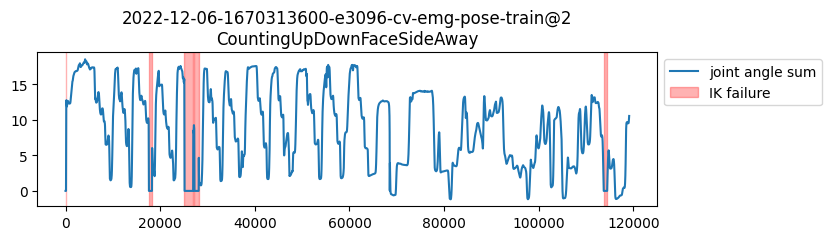

In [ ]:
import emg2pose.visualization as visualization

visualization.ik_failure_plot(data)

In [ ]:
from emg2pose.utils import downsample
import numpy as np

joint_angles = data["joint_angles"]
joint_angles_30hz = downsample(joint_angles, native_fs=2000, target_fs=30)

assert not np.any(np.isnan(joint_angles_30hz))

visualization.plot_hand_mesh(joint_angles_30hz[100], auto_range=False)

In [ ]:
import numpy as np


import matplotlib.pyplot as plt
%config InlineBackend.figure_format='retina'

In [ ]:
visualization.get_plotly_animation_for_joint_angles(joint_angles_30hz[0:250])

Rendering: 250it [00:02, 89.91it/s] 


### Render the Plotly Animation to Video Frames

In [ ]:
import mediapy

frames = visualization.joint_angles_to_frames_parallel(joint_angles_30hz[0:250])
frames = visualization.remove_alpha_channel(frames)
mediapy.show_video(frames, width=800, fps=30, downsample=True)

 10%|█         | 25/250 [02:57<26:38,  7.11s/it]

## Let's Load a Checkpoint and Generate some Predictions

In [ ]:
!cd {DATA_DOWNLOAD_DIR} \
&& curl "https://fb-ctrl-oss.s3.amazonaws.com/emg2pose/emg2pose_model_checkpoints.tar.gz" -o emg2pose_model_checkpoints.tar.gz && \
tar -xvzf emg2pose_model_checkpoints.tar.gz

In [ ]:
from emg2pose.utils import generate_hydra_config_from_overrides

config = generate_hydra_config_from_overrides(
    overrides=[
        "experiment=tracking_vemg2pose",
        f"checkpoint={DATA_DOWNLOAD_DIR}/emg2pose_model_checkpoints/regression_vemg2pose.ckpt"
    ]
)

In [ ]:
from emg2pose.lightning import Emg2PoseModule

module = Emg2PoseModule.load_from_checkpoint(
    config.checkpoint,
    network=config.network,
    optimizer=config.optimizer,
    lr_scheduler=config.lr_scheduler,
)

In [ ]:
session = data
start_idx = 0
stop_idx = 10_000

In [ ]:
import torch

session_window = session[start_idx:stop_idx]

# no_ik_failure is not a field so we slice separately
no_ik_failure_window = session.no_ik_failure[start_idx:stop_idx]

batch = {
    "emg": torch.Tensor([session_window["emg"].T]),  # BCT
    "joint_angles": torch.Tensor([session_window["joint_angles"].T]),  # BCT
    "no_ik_failure": torch.Tensor([no_ik_failure_window]),  # BT
}

preds, joint_angles, no_ik_failure = module.forward(batch)

# Algorithms that use the initial state for ground truth will do poorly
# when the first joint angles are missing!
if (joint_angles[:, 0] == 0).all():
    print(
        "Warning! Ground truth not available at first time step!"
    )

# BCT --> TC (as numpy)
preds = preds[0].T.detach().numpy()
joint_angles = joint_angles[0].T.detach().numpy()

In [ ]:
preds.shape

In [ ]:
joint_angles.shape

In [ ]:
joint_angles_30hz = downsample(joint_angles, native_fs = 2000, target_fs = 30)
visualization.get_plotly_animation_for_joint_angles(joint_angles_30hz[0:250], color="gray")

In [ ]:
preds_30hz = downsample(preds, native_fs=2000, target_fs=30)
visualization.get_plotly_animation_for_joint_angles(preds_30hz[0:250], color="lightpink")

### Compare the Ground Truth and Predictions Side-by-Side

In [ ]:
gt_frames = visualization.joint_angles_to_frames_parallel(joint_angles_30hz[0:250], color="gray")
pred_frames = visualization.joint_angles_to_frames_parallel(preds_30hz[0:250], color="lightpink")

gt_frames = visualization.remove_alpha_channel(gt_frames)
pred_frames = visualization.remove_alpha_channel(pred_frames)

In [ ]:
mediapy.show_videos(dict(gt=gt_frames, pred=pred_frames), width=400, fps=30, downsample=True)

In [ ]:
N_COLS = 2
N_ROWS = 10

fig, axs = plt.subplots(N_ROWS, N_COLS, figsize=(4*N_COLS, 2*N_ROWS))

axs_flattened = axs.flatten()
for i, ax in enumerate(axs_flattened):
    ax.set_title(f"Joint Angle {i}")
    ax.plot(joint_angles_30hz[:, i], label="gt")
    ax.plot(preds_30hz[:, i], label="pred")

    ax.legend()

fig.suptitle("Predicted vs. Ground Truth Joint Angles")

plt.tight_layout()
fig.subplots_adjust(top=0.95)

plt.show()